# Chapter 4.5: Text encoding

Let's start by getting "Pride and Prejudice."

In [1]:
!ls ../data/external/pride_and_prejudice

1342-0.txt


In [2]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

torch.set_printoptions(edgeitems=2)
torch.manual_seed(42) # Life, the Universe, and Everything

In [3]:
with open('../data/external/pride_and_prejudice/1342-0.txt',
          encoding='utf8') as f:
    text = f.read()

In [6]:
lines = text.split('\n')
line = lines[200]
line

'      Michaelmas, and some of his servants are to be in the house by'

In [8]:
letter_t = torch.zeros(len(line), 128)
letter_t.shape

torch.Size([68, 128])

In [14]:
for i, letter in enumerate(line.lower().strip()):
    if ord(letter) < 128:
        letter_index = ord(letter)
    else:
        letter_index = 0
    letter_t[i][letter_index] = 1

In [15]:
def clean_words(input_str):
    punctuation = '.,;:"!?”“_-'
    word_list = input_str.lower().replace('\n', ' ').split()
    word_list = [word.strip(punctuation) for word in word_list]
    return word_list

words_in_line = clean_words(line)
line, words_in_line

('      Michaelmas, and some of his servants are to be in the house by',
 ['michaelmas',
  'and',
  'some',
  'of',
  'his',
  'servants',
  'are',
  'to',
  'be',
  'in',
  'the',
  'house',
  'by'])

In [20]:
word_list = sorted(set(clean_words(text)))
word2index_dict = { word: i for (i, word) in enumerate(word_list)}

len(word2index_dict), word2index_dict['impossible']

(7278, 3383)

In [22]:
word_t = torch.zeros(len(words_in_line), len(word2index_dict))
for i, word in enumerate(words_in_line):
    word_index = word2index_dict[word]
    word_t[i][word_index] = 1
    print('{:2} {:4} {}'.format(i, word_index, word))

 0 4167 michaelmas
 1  429 and
 2 6045 some
 3 4511 of
 4 3216 his
 5 5842 servants
 6  531 are
 7 6546 to
 8  728 be
 9 3409 in
10 6466 the
11 3253 house
12  981 by


In [70]:
import imageio

red_img_path = '../data/external/red.jpg'
green_img_path = '../data/external/green.jpg'
blue_img_path = '../data/external/blue.jpg'

red_img_arr = imageio.imread(red_img_path)
green_img_arr = imageio.imread(green_img_path)
blue_img_arr = imageio.imread(blue_img_path)

red_img_arr.shape, green_img_arr.shape, blue_img_arr.shape

((177, 284, 3), (2215, 3322, 3), (1200, 1600, 3))

In [71]:
red_img = torch.from_numpy(red_img_arr)
green_img = torch.from_numpy(green_img_arr)
blue_img = torch.from_numpy(blue_img_arr)

In [72]:
red_img.float().mean(), green_img.float().mean(), blue_img.float().mean()

(tensor(77.0317), tensor(66.4357), tensor(85.7131))

In [73]:
red_img.shape, green_img.shape, blue_img.shape

(torch.Size([177, 284, 3]),
 torch.Size([2215, 3322, 3]),
 torch.Size([1200, 1600, 3]))

In [74]:
from PIL import Image

In [75]:
chan_0 = 0
chan_1 = 1
chan_2 = 2

def chan_brightness(t):
    print("Channel 0 mean: {}".format(t[:, :, chan_0].float().mean()))
    print("Channel 1 mean: {}".format(t[:, :, chan_1].float().mean()))
    print("Channel 2 mean: {}".format(t[:, :, chan_2].float().mean()))


Channel 0 mean: 113.79454040527344
Channel 1 mean: 63.74562454223633
Channel 2 mean: 53.55490493774414


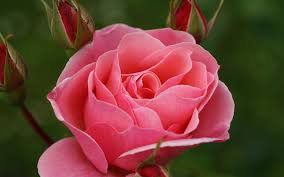

In [76]:
chan_brightness(red_img)
Image.open(red_img_path)

Channel 0 mean: 66.77853393554688
Channel 1 mean: 108.42736053466797
Channel 2 mean: 24.101102828979492


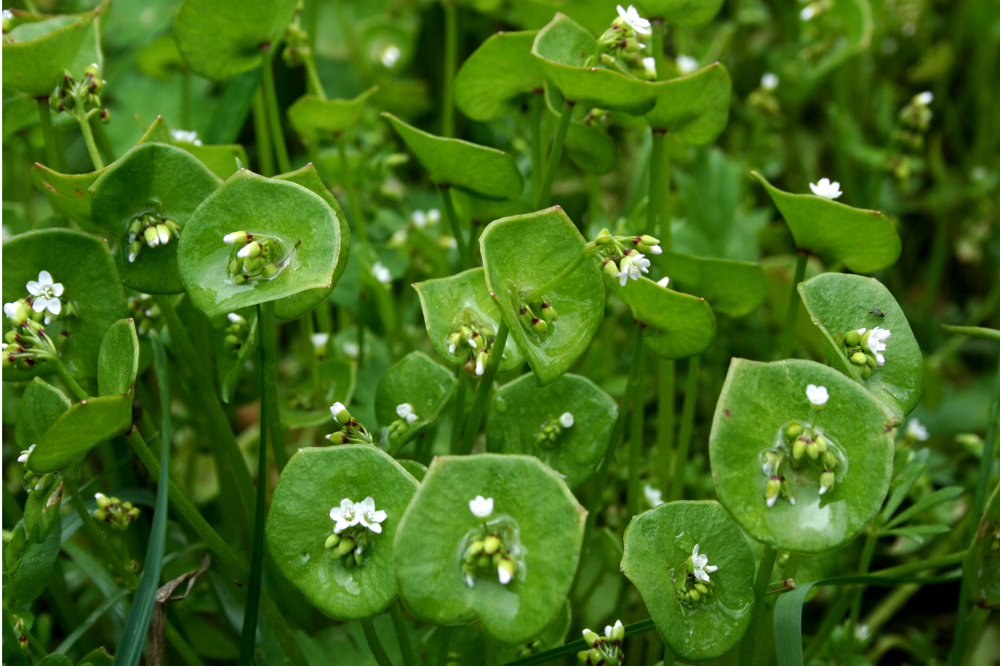

In [77]:
chan_brightness(green_img)
Image.open(green_img_path)

Channel 0 mean: 26.993608474731445
Channel 1 mean: 56.9401969909668
Channel 2 mean: 173.20553588867188


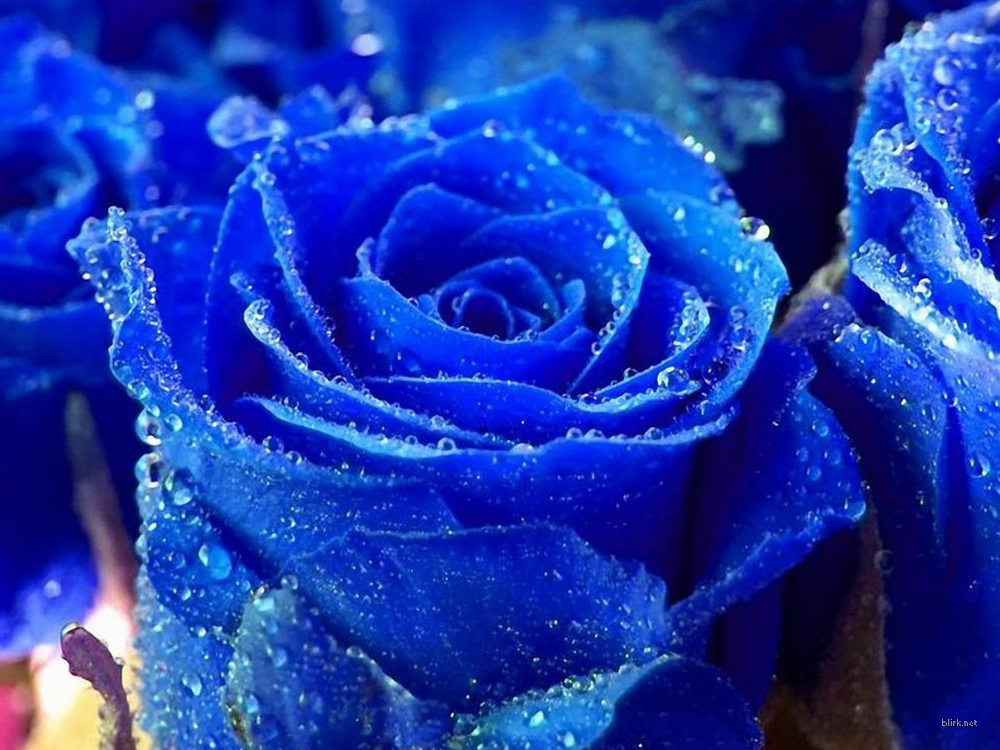

In [78]:
chan_brightness(blue_img)
Image.open(blue_img_path)